# Neural Network with Numpy
This is an implementation of a feed forward neural network using numpy. This model uses a dataset containing the pixel values of clothing images and categorize them into 10 different classes.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import math

In [25]:
train_data = pd.read_csv('trainData.csv', header=None)
train_lb = pd.read_csv('trainLabels.csv', header=None)
test_data = pd.read_csv('testData.csv', header=None)
test_lb = pd.read_csv('testLabels.csv', header=None)
train_data

,0,1,2,3,4,5,6,7,8,9,...,774,775,776,777,778,779,780,781,782,783
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,1,0,0,0,0,...,119,114,130,76,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,22,...,0,0,1,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,33,96,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59995,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
59996,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
59997,0,0,0,0,0,0,0,0,0,5,...,0,0,0,0,0,0,0,0,0,0
59998,0,0,0,0,0,0,0,0,0,0,...,66,54,50,5,0,1,0,0,0,0


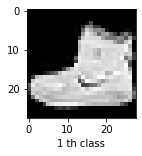

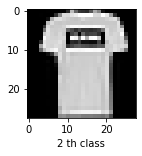

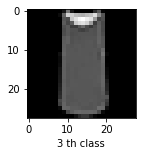

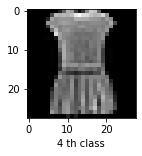

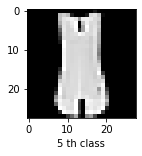

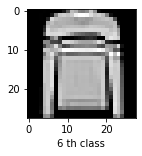

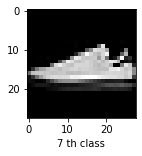

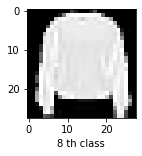

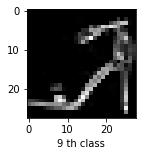

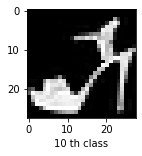

In [42]:
indexes = []
for i in range(10):
    indexes.append(train_lb.index[train_lb[0] == i].tolist()[0])

for i in range(10):
    x = np.array(train_data.iloc[i])
    x = x.reshape(28,28)
    plt.figure(figsize=(2, 2))
    plt.imshow(x, cmap='gray')
    plt.xlabel(str(i+1)+' th class')
    plt.show()

[6000, 6000, 6000, 6000, 6000, 6000, 6000, 6000, 6000, 6000]
[1000, 1000, 1000, 1000, 1000, 1000, 1000, 1000, 1000, 1000]


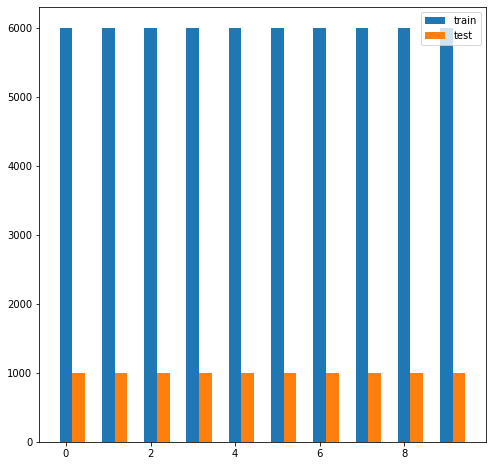

In [50]:
train_values = []
test_values = []
for i in range(10) :
    train_values.append(train_lb.loc[ train_lb[0] == i ].shape[0])
    test_values.append(test_lb.loc[test_lb[0] == i].shape[0])
plt.figure(figsize=(8, 8))
plt.bar([i for i in range(10)], train_values, label='train', width=0.3)
plt.bar([i+0.3 for i in range(10)], test_values, label='test', width=0.3)
plt.legend()
plt.show()

Normalization makes all the data to be between the range of 0 to 1 this way we can benefit from working with smaller numbers which requires less process and also prevent gradian explosion

In [8]:
t = train_data / 255
t.to_csv('NtrainData.csv', headers = None, )

# Dataloader

In [2]:
class Dataloader:
    
    def __init__(self, data, labels, n_classes, batch_size=None, shuffle=False):
        
        assert len(data)==len(labels)
        self.__n_classes = n_classes
        self.__batch_size = batch_size
        self.__shuffle = shuffle
        self.__data = data
        self.__onehot_labels = self.__onehot(labels, self.__n_classes)
    
    def __onehot(self, labels, n_classes):
        labels_changed = labels.reshape(-1)
        n_values = np.max(labels_changed) + 1
        onehot_vectors = np.eye(n_values)[labels_changed]
        return onehot_vectors
    
    def __shuffle_dataset(self):
        order = np.random.permutation(len(self.__data))
        self.__data = self.__data[order]
        self.__onehot_labels = self.__onehot_labels[order]
    
    def __iter__(self):
        if self.__shuffle:
            self.__shuffle_dataset()
            
        if self.__batch_size==None:
            yield (np.matrix(self.__data), np.matrix(self.__onehot_labels))
            return
            
        for idx in range(0, len(self.__data), self.__batch_size):
            yield (np.matrix(self.__data[idx:idx+self.__batch_size]), 
                   np.matrix(self.__onehot_labels[idx:idx+self.__batch_size]))


# Activation Functions

In [3]:
class Identical:
    
    def __init__(self): pass
    
    def __val(self, matrix):
        identical_value = np.matrix(matrix, dtype=float)
        return identical_value

    def derivative(self, matrix):
        temp = np.matrix(matrix, dtype=float)
        identical_derivative = np.matrix(np.full(np.shape(temp), 1.))
        return identical_derivative
    
    def __call__(self, matrix):
        return self.__val(matrix)
    

class Relu:
    
    def __init__(self): pass
        
    def __f(self, x):
        return max(0, x)

    def __df(self, x):
        return 0 if x < 0 else 1   
    
    def __relu(self, matrix):
        func = np.vectorize(self.__f)
        relu_value = func(matrix)
        return relu_value

    def derivative(self, matrix):
        func = np.vectorize(self.__df)
        relu_derivative = func(matrix)
        return relu_derivative
    
    def __call__(self, matrix):
        return self.__relu(matrix)

    
class LeakyRelu:
    
    def __init__(self, negative_slope=0.01):
        self.negative_slope = 0.01
    
    def __f(self, x):
        return x if x >= 0 else x*self.negative_slope

    def __df(self, x):
        return 1 if x >= 0 else self.negative_slope
    
    def __val(self, matrix):
        func = np.vectorize(self.__f)
        leacky_relu_value = func(matrix)
        return leacky_relu_value

    def derivative(self, matrix):
        func = np.vectorize(self.__df)
        leacky_relu_derivative = func(matrix)
        return leacky_relu_derivative
    
    def __call__(self, matrix):
        return self.__val(matrix)

    
class Sigmoid:
    
    def __init__(self): pass

    def __f(self, x):
        return 1/(1+math.exp(-x))

    def __df(self, x):
        return self.__f(x)*(1-self.__f(x))

    def __val(self, matrix):
        func = np.vectorize(self.__f)
        sigmoid_value = func(matrix)
        return sigmoid_value

    def derivative(self, matrix):
        func = np.vectorize(self.__df)
        sigmoid_derivative = func(matrix)
        return sigmoid_derivative
    
    def __call__(self, matrix):
        return self.__val(matrix)


class Softmax:
    
    def __init__(self): pass

    def __val(self, matrix):
        mx = matrix.max(axis=1)
        numerator = np.exp(matrix - mx)
        denominator = np.sum(numerator, axis=-1)
        softmax_value = numerator/denominator
        return softmax_value

    def derivative(self, matrix):
        # TODO: Implement
        return softmax_derivative
    
    def __call__(self, matrix):
        return self.__val(matrix)


# Loss Function

In [4]:
class CrossEntropy: #(with softmax)
    
    def __init__(self): pass

    def __val(self, true_val, expected_val):
        assert np.shape(true_val)==np.shape(expected_val)
        softmax_output = Softmax()(true_val)
        cross_entropy_value = -1*np.multiply(np.log(softmax_output), expected_val).sum(1)
        return cross_entropy_value
        
    def derivative(self, true_val, expected_val):
        assert np.shape(true_val)==np.shape(expected_val)
        cross_entropy_derivative = Softmax()(true_val) - expected_val
        return cross_entropy_derivative
    
    def __call__(self, true_val, expected_val):
        return self.__val(true_val, expected_val)


# Layer

In [71]:
class Layer:

    DEFAULT_LOW, DEFAULT_HIGH, DEFAULT_MEAN, DEFAULT_VAR = 0, 0.05, 0., 1.
  
    def __init__(self, input_size, output_size, 
                 activation=Identical(), initial_weight='uniform', **initializing_parameters):
        
        assert type(initial_weight)==str, 'Undefined activation function!'
        self.__weight_initializer_dict = {'uniform':self.__uniform_weight, 'normal':self.__normal_weight}
        assert initial_weight in self.__weight_initializer_dict, 'Undefined weight initialization function!'
        
        self.__n_neurons = output_size
        weight_initializer = self.__weight_initializer_dict[initial_weight]
        self.__weight = weight_initializer(input_size, self.__n_neurons, **initializing_parameters)
        self.__bias = weight_initializer(1, self.__n_neurons, **initializing_parameters)
        self.__activation = activation
        
        self.__last_input = None
        self.__last_activation_input = None
        self.__last_activation_output = None
        self.__last_activation_derivative = None
        
    def forward(self, layer_input):
        assert np.ndim(layer_input)==2
        assert np.size(self.__weight,0) == np.size(layer_input,1)
        self.__last_input = layer_input
        self.__last_activation_input = np.matmul(layer_input, self.__weight)
        self.__last_activation_input = self.__last_activation_input + self.__bias
        self.__last_activation_output = self.__activation(self.__last_activation_input)
        self.__last_activation_derivative = self.__activation.derivative(self.__last_activation_input)
        return self.__last_activation_output
    
    def update_weights(self, backprop_tensor, lr):
        assert np.ndim(backprop_tensor)==2
        assert np.size(backprop_tensor,0) == np.size(self.__last_activation_derivative,0)
        assert np.size(backprop_tensor,1) == self.__n_neurons

        dEdY = np.multiply(backprop_tensor, self.__last_activation_derivative)
        dEdW = np.matmul(np.transpose(self.__last_input), dEdY)
        backprop_tensor = np.matmul(dEdY, np.transpose(self.__weight))
        self.__weight = self.__weight - lr*dEdW

        dEdB = dEdY.sum(axis = 1)
        self.__bias = self.__bias - lr*dEdB
        return backprop_tensor

    def __uniform_weight(self, dim1, dim2, **initializing_parameters):
        low, high = self.DEFAULT_LOW, self.DEFAULT_HIGH
        if 'low' in initializing_parameters.keys(): low = initializing_parameters['low']
        if 'high' in initializing_parameters.keys(): high = initializing_parameters['high']
        weights = np.random.uniform(low=low, high=high, size=(dim1, dim2))
        return weights

    def __normal_weight(self, dim1, dim2, **initializing_parameters):
        mean, var = self.DEFAULT_MEAN, self.DEFAULT_VAR
        if 'mean' in initializing_parameters.keys(): mean = initializing_parameters['mean']
        if 'var' in initializing_parameters.keys(): var = initializing_parameters['var']
        weights = np.random.normal(mean, np.sqrt(var), (dim1, dim2))
        return weights
    
    def get_output(self):
        return self.__last_activation_output

    @property
    def n_neurons(self): return self.__n_neurons
    
    @property
    def weight(self): return self.__weight
    
    @property
    def bias(self): return self.__bias
    
    @property
    def activation(self): return self.__activation


# Feed Forward Neural Network

In [72]:
class FeedForwardNN:
    
    def __init__(self, input_shape):
        
        self.__input_shape = input_shape
        self.__output_shape = None
        
        self.__layers_list = []
        
        self.__lr = None
        self.__loss = None

        self.train_output = []
        self.test_output = []

        
    def add_layer(self, n_neurons, activation=Relu(), initial_weight='uniform', **initializing_parameters):
         
        assert type(n_neurons)==int, "Invalid number of neurons for the layer!"
        assert n_neurons>0, "Invalid number of neurons for the layer!"
        
        n_prev_neurons = self.__input_shape if len(self.__layers_list)==0 else self.__layers_list[-1].n_neurons
        new_layer = Layer(n_prev_neurons, n_neurons, activation, initial_weight, **initializing_parameters)
        self.__layers_list.append(new_layer)
        self.__output_shape = self.__layers_list[-1].n_neurons 
      
    
    def set_training_param(self, loss=CrossEntropy(), lr=1e-3):
        assert self.__layers_list, "Uncomplete model!"
        self.__loss = loss
        self.__lr = lr
    
    
    def forward(self, network_input):
        assert type(self.__output_shape) != None, "Model is not compiled!"        
        inp = network_input
        for layer in self.__layers_list:
            inp = layer.forward(inp)
        network_output = inp
        return network_output
    
    
    def fit(self, epochs, trainloader, testloader=None, print_results=True):
        
        assert type(self.__output_shape) != None, "Model is not compiled!"
        assert type(self.__lr) != None and type(self.__loss) != None, "Training paramenters are not set!"

        log = {"train_accuracy":[], "train_loss":[], "test_accuracy":[], "test_loss":[]}
        
        for epoch in range(1, epochs+1):
            
            if print_results: 
                print('Epoch {}:'.format(epoch)) 

            self.train_output = []
            self.test_output = []
                
            average_accuracy, average_loss = self.__train(trainloader)
            log['train_accuracy'].append(average_accuracy)
            log['train_loss'].append(average_loss)
            if print_results:
                print('\tTrain: Average Accuracy: {}\tAverage Loss: {}'.format(average_accuracy, average_loss))
            
            if type(testloader) != type(None):
                average_accuracy, average_loss = self.__test(testloader)
                log['test_accuracy'].append(average_accuracy)
                log['test_loss'].append(average_loss)
                if print_results:
                    print('\tTest: Average Accuracy: {}\tAverage Loss: {}'.format(average_accuracy, average_loss))
                    
        return log
    
    
    def __train(self, trainloader):
        bach_accuracies, batch_losses = [], []
        size = -1
        for x_train, y_train in trainloader:
            if size == -1:
                size = x_train.shape[0]
            if x_train.shape[0] != size:
                break
            batch_accuracy, batch_loss = self.__train_on_batch(x_train, y_train)
            bach_accuracies.append(batch_accuracy)
            batch_losses.append(batch_loss)
        return np.mean(bach_accuracies), np.mean(batch_losses)
    
    
    def __test(self, testloader):
        bach_accuracies, batch_losses = [], []
        size = -1
        for x_test, y_test in testloader:
            if size == -1:
                size = x_test.shape[0]
            if x_test.shape[0] != size:
                break
            batch_accuracy, batch_loss = self.__test_on_batch(x_test, y_test)
            bach_accuracies.append(batch_accuracy)
            batch_losses.append(batch_loss)
        return np.mean(bach_accuracies), np.mean(batch_losses)

    
    def __train_on_batch(self, x_batch, y_batch):
        output = self.forward(x_batch)
        self.__update_weights(output, y_batch)
        batch_accuracy = self.__compute_accuracy(output, y_batch)
        batch_average_loss = np.mean(self.__loss(output, y_batch))

        self.train_output.append((self.__layers_list[-2].get_output(), y_batch))

        return (batch_accuracy, batch_average_loss)
        
        
    def __test_on_batch(self, x_batch, y_batch):
        output = self.forward(x_batch)
        batch_accuracy = self.__compute_accuracy(output, y_batch)
        batch_average_loss = np.mean(self.__loss(output, y_batch))

        self.test_output.append((self.__layers_list[-2].get_output(), y_batch))

        return (batch_accuracy, batch_average_loss)

    def get_outputs(self):
        return self.train_output, self.test_output
            
        
    def __get_labels(self, outputs):
        # TODO: Implement
        return labels
    
    
    def __compute_accuracy(self, output, expected_output):
        true_labels = np.argmax(output, axis=1)
        expected_labels = np.argmax(expected_output, axis=1)
        assert len(true_labels) == len(expected_labels)
        accuracy = (true_labels == expected_labels).sum() / len(true_labels)
        return accuracy
    
    
    def __update_weights(self, output, y_train):
        backprob_tensor = self.__loss.derivative(output, y_train)
        for layer in reversed(self.__layers_list):
            backprob_tensor = layer.update_weights(backprob_tensor, self.__lr)
        return


# Training Sample Code

Loading and normalizing data

In [7]:
train_data = np.loadtxt(open("trainData.csv", "rb"), delimiter=",")
train_labels = np.loadtxt(open("trainLabels.csv", "rb"), delimiter=",")
test_data = np.loadtxt(open("testData.csv", "rb"), delimiter=",")
test_labels = np.loadtxt(open("testLabels.csv", "rb"), delimiter=",")

In [8]:
ntrain_data = train_data / 255
ntest_data = test_data / 255
train_labels = train_labels.astype('int64')
test_labels = test_labels.astype('int64')

## First tests

In [9]:
INPUT_SHAPE = len(ntrain_data[0])
LEARNING_RATE = 1e-3
EPOCHS = 30
TRAINLOADER = Dataloader(ntrain_data, train_labels, 10, 32, True)
TESTLOADER = Dataloader(ntest_data, test_labels, 10, 32, True)

network = FeedForwardNN(INPUT_SHAPE)
network.add_layer(20, input_shape=INPUT_SHAPE, activation=LeakyRelu(), weight_initializer='uniform')
network.add_layer(10, activation=LeakyRelu(), weight_initializer='uniform')
network.set_training_param(loss=CrossEntropy(), lr=LEARNING_RATE)

log = network.fit(EPOCHS, TRAINLOADER, TESTLOADER, print_results=True)

Epoch 1:
	Train: Average Accuracy: 0.1016	Average Loss: 2.303680558715418
	Test: Average Accuracy: 0.1759815705128205	Average Loss: 2.286143790941447
Epoch 2:
	Train: Average Accuracy: 0.12085	Average Loss: 2.281920567023503
	Test: Average Accuracy: 0.10717147435897435	Average Loss: 2.2747059634176545
Epoch 3:
	Train: Average Accuracy: 0.11746666666666666	Average Loss: 2.2673658952396276
	Test: Average Accuracy: 0.14733573717948717	Average Loss: 2.258680482511617
Epoch 4:
	Train: Average Accuracy: 0.11275	Average Loss: 2.2495971297522357
	Test: Average Accuracy: 0.10016025641025642	Average Loss: 2.238124084255277
Epoch 5:
	Train: Average Accuracy: 0.10413333333333333	Average Loss: 2.224261378379141
	Test: Average Accuracy: 0.10697115384615384	Average Loss: 2.207060253111821
Epoch 6:
	Train: Average Accuracy: 0.10248333333333333	Average Loss: 2.191978404986267
	Test: Average Accuracy: 0.12920673076923078	Average Loss: 2.1666944352726194
Epoch 7:
	Train: Average Accuracy: 0.1147166666666

In [10]:
INPUT_SHAPE = len(ntrain_data[0])
LEARNING_RATE = 1e-2
EPOCHS = 30
TRAINLOADER = Dataloader(ntrain_data, train_labels, 10, 32, True)
TESTLOADER = Dataloader(ntest_data, test_labels, 10, 32, True)

network = FeedForwardNN(INPUT_SHAPE)
network.add_layer(20, input_shape=INPUT_SHAPE, activation=LeakyRelu(), weight_initializer='uniform')
network.add_layer(10, activation=LeakyRelu(), weight_initializer='uniform')
network.set_training_param(loss=CrossEntropy(), lr=LEARNING_RATE)

log = network.fit(EPOCHS, TRAINLOADER, TESTLOADER, print_results=True)

Epoch 1:
	Train: Average Accuracy: 0.296	Average Loss: 1.8647048296442081
	Test: Average Accuracy: 0.5904447115384616	Average Loss: 1.121416934264766
Epoch 2:
	Train: Average Accuracy: 0.6590333333333334	Average Loss: 0.9423386320651389
	Test: Average Accuracy: 0.7305689102564102	Average Loss: 0.7604583227325075
Epoch 3:
	Train: Average Accuracy: 0.7625166666666666	Average Loss: 0.689265072577439
	Test: Average Accuracy: 0.7792467948717948	Average Loss: 0.6576710002445446
Epoch 4:
	Train: Average Accuracy: 0.7972166666666667	Average Loss: 0.5899394244713241
	Test: Average Accuracy: 0.7930689102564102	Average Loss: 0.619184377087444
Epoch 5:
	Train: Average Accuracy: 0.81035	Average Loss: 0.5431638896485333
	Test: Average Accuracy: 0.8092948717948718	Average Loss: 0.5765289375898439
Epoch 6:
	Train: Average Accuracy: 0.82185	Average Loss: 0.5113173861972695
	Test: Average Accuracy: 0.8136017628205128	Average Loss: 0.5738799809092785
Epoch 7:
	Train: Average Accuracy: 0.82805	Average Los

In [11]:
INPUT_SHAPE = len(ntrain_data[0])
LEARNING_RATE = 1e-2
EPOCHS = 30
TRAINLOADER = Dataloader(ntrain_data, train_labels, 10, 32, True)
TESTLOADER = Dataloader(ntest_data, test_labels, 10, 32, True)

network = FeedForwardNN(INPUT_SHAPE)
network.add_layer(20, input_shape=INPUT_SHAPE, activation=LeakyRelu(), weight_initializer='normal')
network.add_layer(10, activation=LeakyRelu(), weight_initializer='normal')
network.set_training_param(loss=CrossEntropy(), lr=LEARNING_RATE)

log = network.fit(EPOCHS, TRAINLOADER, TESTLOADER, print_results=True)

Epoch 1:
	Train: Average Accuracy: 0.41645	Average Loss: 1.4610597755551376
	Test: Average Accuracy: 0.5149238782051282	Average Loss: 1.280469736144469
Epoch 2:
	Train: Average Accuracy: 0.6201333333333333	Average Loss: 0.9575558764507822
	Test: Average Accuracy: 0.6623597756410257	Average Loss: 0.8235302321713297
Epoch 3:
	Train: Average Accuracy: 0.65015	Average Loss: 0.9846977975800948
	Test: Average Accuracy: 0.6939102564102564	Average Loss: 0.8522496660191675
Epoch 4:
	Train: Average Accuracy: 0.7141	Average Loss: 0.7916571445144528
	Test: Average Accuracy: 0.6154847756410257	Average Loss: 0.9767128895670291
Epoch 5:
	Train: Average Accuracy: 0.7369	Average Loss: 0.7284742149734278
	Test: Average Accuracy: 0.7464943910256411	Average Loss: 0.6822359567166351
Epoch 6:
	Train: Average Accuracy: 0.7538333333333334	Average Loss: 0.6843729631804568
	Test: Average Accuracy: 0.7555088141025641	Average Loss: 0.6589344380537473
Epoch 7:
	Train: Average Accuracy: 0.7657666666666667	Average L

## testing with relu as the activation fucntion and different learning rates

In [12]:
INPUT_SHAPE = len(ntrain_data[0])
LEARNING_RATE = 1e-2
EPOCHS = 30
TRAINLOADER = Dataloader(ntrain_data, train_labels, 10, 32, True)
TESTLOADER = Dataloader(ntest_data, test_labels, 10, 32, True)

network = FeedForwardNN(INPUT_SHAPE)
network.add_layer(20, input_shape=INPUT_SHAPE, activation= Relu(), weight_initializer='uniform')
network.add_layer(10, activation=Relu(), weight_initializer='uniform')
network.set_training_param(loss=CrossEntropy(), lr=LEARNING_RATE)

log = network.fit(EPOCHS, TRAINLOADER, TESTLOADER, print_results=True)

Epoch 1:
	Train: Average Accuracy: 0.24038333333333334	Average Loss: 2.030406851244226
	Test: Average Accuracy: 0.35396634615384615	Average Loss: 1.7677377121148798
Epoch 2:
	Train: Average Accuracy: 0.3609833333333333	Average Loss: 1.7286198845923555
	Test: Average Accuracy: 0.36538461538461536	Average Loss: 1.7221738496722447
Epoch 3:
	Train: Average Accuracy: 0.37205	Average Loss: 1.6948512374799212
	Test: Average Accuracy: 0.3717948717948718	Average Loss: 1.7008812361970786
Epoch 4:
	Train: Average Accuracy: 0.4031	Average Loss: 1.5784623013449706
	Test: Average Accuracy: 0.39903846153846156	Average Loss: 1.420611593840557
Epoch 5:
	Train: Average Accuracy: 0.38148333333333334	Average Loss: 1.498960319089471
	Test: Average Accuracy: 0.3762019230769231	Average Loss: 1.4415585204603383
Epoch 6:
	Train: Average Accuracy: 0.44656666666666667	Average Loss: 1.3799253570905765
	Test: Average Accuracy: 0.5418669871794872	Average Loss: 1.2433399141888413
Epoch 7:
	Train: Average Accuracy: 0

In [13]:
INPUT_SHAPE = len(ntrain_data[0])
LEARNING_RATE = 1e-1
EPOCHS = 30
TRAINLOADER = Dataloader(ntrain_data, train_labels, 10, 32, True)
TESTLOADER = Dataloader(ntest_data, test_labels, 10, 32, True)

network = FeedForwardNN(INPUT_SHAPE)
network.add_layer(20, input_shape=INPUT_SHAPE, activation= Relu(), weight_initializer='uniform')
network.add_layer(10, activation=Relu(), weight_initializer='uniform')
network.set_training_param(loss=CrossEntropy(), lr=LEARNING_RATE)

log = network.fit(EPOCHS, TRAINLOADER, TESTLOADER, print_results=True)

Epoch 1:
	Train: Average Accuracy: 0.10105	Average Loss: nan
	Test: Average Accuracy: 0.10216346153846154	Average Loss: 2.302473338472399
Epoch 2:
	Train: Average Accuracy: 0.10021666666666666	Average Loss: 2.302607723806549
	Test: Average Accuracy: 0.10306490384615384	Average Loss: 2.3026500008322635
Epoch 3:
	Train: Average Accuracy: 0.10053333333333334	Average Loss: 2.302650164021695
	Test: Average Accuracy: 0.10106169871794872	Average Loss: 2.3026515336241866
Epoch 4:
	Train: Average Accuracy: 0.10051666666666667	Average Loss: 2.302634041444036
	Test: Average Accuracy: 0.09525240384615384	Average Loss: 2.3025910329635844
Epoch 5:
	Train: Average Accuracy: 0.09903333333333333	Average Loss: 2.3026477010495148
	Test: Average Accuracy: 0.09735576923076923	Average Loss: 2.302692016886203
Epoch 6:
	Train: Average Accuracy: 0.10008333333333333	Average Loss: 2.3026133415447547
	Test: Average Accuracy: 0.09725560897435898	Average Loss: 2.3027150066009066
Epoch 7:
	Train: Average Accuracy: 0

In [105]:
INPUT_SHAPE = len(ntrain_data[0])
LEARNING_RATE = 1e-3
EPOCHS = 30
TRAINLOADER = Dataloader(ntrain_data, train_labels, 10, 32, True)
TESTLOADER = Dataloader(ntest_data, test_labels, 10, 32, True)

network = FeedForwardNN(INPUT_SHAPE)
network.add_layer(20, input_shape=INPUT_SHAPE, activation= Relu(), weight_initializer='uniform')
network.add_layer(10, activation=Identical(), weight_initializer='uniform')
network.set_training_param(loss=CrossEntropy(), lr=LEARNING_RATE)

log = network.fit(EPOCHS, TRAINLOADER, TESTLOADER, print_results=True)

Epoch 1:
	Train: Average Accuracy: 0.6855666666666667	Average Loss: 0.8653604236045115
	Test: Average Accuracy: 0.7938701923076923	Average Loss: 0.5878219256732224
Epoch 2:
	Train: Average Accuracy: 0.8162	Average Loss: 0.5263961981026415
	Test: Average Accuracy: 0.8058894230769231	Average Loss: 0.5502089918679317
Epoch 3:
	Train: Average Accuracy: 0.8332333333333334	Average Loss: 0.4812949221526318
	Test: Average Accuracy: 0.8261217948717948	Average Loss: 0.5065764115737618
Epoch 4:
	Train: Average Accuracy: 0.8411666666666666	Average Loss: 0.458214624097299
	Test: Average Accuracy: 0.8287259615384616	Average Loss: 0.48700957853869387
Epoch 5:
	Train: Average Accuracy: 0.8470333333333333	Average Loss: 0.43798646208696934
	Test: Average Accuracy: 0.8377403846153846	Average Loss: 0.47204780219950293
Epoch 6:
	Train: Average Accuracy: 0.8522166666666666	Average Loss: 0.4247518474430651
	Test: Average Accuracy: 0.8404447115384616	Average Loss: 0.45964455729634096
Epoch 7:
	Train: Average 

1e-3 and 1e-2 have proven to a proprate learning rate for this model but using 1e-1 is too much for learning rate and model didn't perfome well

## using sigmoid and tanh as the activation fucntion

In [106]:
INPUT_SHAPE = len(ntrain_data[0])
LEARNING_RATE = 1e-3
EPOCHS = 30
TRAINLOADER = Dataloader(ntrain_data, train_labels, 10, 32, True)
TESTLOADER = Dataloader(ntest_data, test_labels, 10, 32, True)

network = FeedForwardNN(INPUT_SHAPE)
network.add_layer(20, input_shape=INPUT_SHAPE, activation= Sigmoid(), weight_initializer='uniform')
network.add_layer(10, activation=Identical(), weight_initializer='uniform')
network.set_training_param(loss=CrossEntropy(), lr=LEARNING_RATE)

log = network.fit(EPOCHS, TRAINLOADER, TESTLOADER, print_results=True)

Epoch 1:
	Train: Average Accuracy: 0.10568333333333334	Average Loss: 2.303359604301715
	Test: Average Accuracy: 0.16135817307692307	Average Loss: 2.2664916167614373
Epoch 2:
	Train: Average Accuracy: 0.3359333333333333	Average Loss: 1.8532660266464864
	Test: Average Accuracy: 0.46885016025641024	Average Loss: 1.4384914874773467
Epoch 3:
	Train: Average Accuracy: 0.5610666666666667	Average Loss: 1.2192430891664066
	Test: Average Accuracy: 0.6097756410256411	Average Loss: 1.0702055620694082
Epoch 4:
	Train: Average Accuracy: 0.6744833333333333	Average Loss: 0.9485584976177265
	Test: Average Accuracy: 0.7125400641025641	Average Loss: 0.856132929755225
Epoch 5:
	Train: Average Accuracy: 0.728	Average Loss: 0.7720587554212902
	Test: Average Accuracy: 0.7301682692307693	Average Loss: 0.7325681071864965
Epoch 6:
	Train: Average Accuracy: 0.7499833333333333	Average Loss: 0.6792834672852708
	Test: Average Accuracy: 0.7506009615384616	Average Loss: 0.667960792854443
Epoch 7:
	Train: Average Accu

In [20]:
class Tanh:
    
    def __init__(self): pass

    def __f(self, x):
        return 1/(1+math.exp(-x))
    
    def __Tf(self, x):
        return 2/(1+math.exp(-2*x))

    def __df(self, x):
        return 4*self.__f(2*x)*(1-self.__f(2*x))

    def __val(self, matrix):
        func = np.vectorize(self.__Tf)
        sigmoid_value = func(matrix)
        return sigmoid_value

    def derivative(self, matrix):
        func = np.vectorize(self.__df)
        sigmoid_derivative = func(matrix)
        return sigmoid_derivative
    
    def __call__(self, matrix):
        return self.__val(matrix)


INPUT_SHAPE = len(ntrain_data[0])
LEARNING_RATE = 1e-2
EPOCHS = 30
TRAINLOADER = Dataloader(ntrain_data, train_labels, 10, 32, True)
TESTLOADER = Dataloader(ntest_data, test_labels, 10, 32, True)

network = FeedForwardNN(INPUT_SHAPE)
network.add_layer(20, input_shape=INPUT_SHAPE, activation= Tanh(), weight_initializer='uniform')
network.add_layer(10, activation=Tanh(), weight_initializer='uniform')
network.set_training_param(loss=CrossEntropy(), lr=LEARNING_RATE)

log = network.fit(EPOCHS, TRAINLOADER, TESTLOADER, print_results=True)

Epoch 1:
	Train: Average Accuracy: 0.10005	Average Loss: 2.3027073743128343
	Test: Average Accuracy: 0.10016025641025642	Average Loss: 2.3024699597442333
Epoch 2:
	Train: Average Accuracy: 0.1	Average Loss: 2.302488257981192
	Test: Average Accuracy: 0.10006009615384616	Average Loss: 2.3023766008258995
Epoch 3:
	Train: Average Accuracy: 0.10166666666666667	Average Loss: 2.2128100044251013
	Test: Average Accuracy: 0.10006009615384616	Average Loss: 1.814206743828389
Epoch 4:
	Train: Average Accuracy: 0.10786666666666667	Average Loss: 1.5530778156439367
	Test: Average Accuracy: 0.16756810897435898	Average Loss: 1.4221891222044196
Epoch 5:
	Train: Average Accuracy: 0.44465	Average Loss: 1.2628679959970186
	Test: Average Accuracy: 0.6572516025641025	Average Loss: 1.1381175464090842
Epoch 6:
	Train: Average Accuracy: 0.6724	Average Loss: 1.1170395432327267
	Test: Average Accuracy: 0.6724759615384616	Average Loss: 1.1195578455022863
Epoch 7:
	Train: Average Accuracy: 0.7106333333333333	Average

Sigmoid and Tanh has very small derivaing for too large of too small values and this derivative which will be used for updating the weights become very small and almost makes the weights stop changing so using this activation functions especially in deep networks wouldn't be a good choice

Relu turns the output and its derivative to zero for negetive values this makes the noroun to have no contibution to output and also no contibution to the updating prcess so using LeakyRelu that doesn't compeletly ignores the negetive values would be a better choice.

## Testing the model with different batch sizes
Choosing large or small batch size comes with pros. and cons. Large batches allow faster computaion and more reliable loss value since its mean of more instances of data but it lessen the number of time our weights are being updated. Also small batches makes the updating process more frequent but also less considrate for the whole data which may be good in case we want to exit local maxes but it's not wise to choose very small batch size. 

In [21]:
INPUT_SHAPE = len(ntrain_data[0])
LEARNING_RATE = 1e-2
EPOCHS = 30
TRAINLOADER = Dataloader(ntrain_data, train_labels, 10, 16, True)
TESTLOADER = Dataloader(ntest_data, test_labels, 10, 16, True)

network = FeedForwardNN(INPUT_SHAPE)
network.add_layer(20, input_shape=INPUT_SHAPE, activation=LeakyRelu(), weight_initializer='uniform')
network.add_layer(10, activation=LeakyRelu(), weight_initializer='uniform')
network.set_training_param(loss=CrossEntropy(), lr=LEARNING_RATE)

log = network.fit(EPOCHS, TRAINLOADER, TESTLOADER, print_results=True)

Epoch 1:
	Train: Average Accuracy: 0.6545833333333333	Average Loss: 0.9488920263795034
	Test: Average Accuracy: 0.7811	Average Loss: 0.639590394118859
Epoch 2:
	Train: Average Accuracy: 0.77305	Average Loss: 0.6558084148038149
	Test: Average Accuracy: 0.7922	Average Loss: 0.6063791197397552
Epoch 3:
	Train: Average Accuracy: 0.7844833333333333	Average Loss: 0.6313668629364496
	Test: Average Accuracy: 0.7495	Average Loss: 0.7455449469581558
Epoch 4:
	Train: Average Accuracy: 0.7895166666666666	Average Loss: 0.6132806786412112
	Test: Average Accuracy: 0.7471	Average Loss: 0.7941653065233901
Epoch 5:
	Train: Average Accuracy: 0.79575	Average Loss: 0.6060134225710195
	Test: Average Accuracy: 0.7517	Average Loss: 0.7023404007178948
Epoch 6:
	Train: Average Accuracy: 0.7978833333333334	Average Loss: 0.5974807617139655
	Test: Average Accuracy: 0.8115	Average Loss: 0.5723660452579371
Epoch 7:
	Train: Average Accuracy: 0.8006833333333333	Average Loss: 0.591977413439563
	Test: Average Accuracy: 

In [22]:
INPUT_SHAPE = len(ntrain_data[0])
LEARNING_RATE = 1e-2
EPOCHS = 30
TRAINLOADER = Dataloader(ntrain_data, train_labels, 10, 128, True)
TESTLOADER = Dataloader(ntest_data, test_labels, 10, 128, True)

network = FeedForwardNN(INPUT_SHAPE)
network.add_layer(20, input_shape=INPUT_SHAPE, activation=LeakyRelu(), weight_initializer='uniform')
network.add_layer(10, activation=LeakyRelu(), weight_initializer='uniform')
network.set_training_param(loss=CrossEntropy(), lr=LEARNING_RATE)

log = network.fit(EPOCHS, TRAINLOADER, TESTLOADER, print_results=True)

Epoch 1:
	Train: Average Accuracy: 0.1003772702991453	Average Loss: nan
	Test: Average Accuracy: 0.08974358974358974	Average Loss: 2.2557228398971385
Epoch 2:
	Train: Average Accuracy: 0.1007278311965812	Average Loss: 2.254665109280483
	Test: Average Accuracy: 0.0999599358974359	Average Loss: 2.252763081485271
Epoch 3:
	Train: Average Accuracy: 0.10303151709401709	Average Loss: 2.251742179055392
	Test: Average Accuracy: 0.10296474358974358	Average Loss: 2.249617526119935
Epoch 4:
	Train: Average Accuracy: 0.10730502136752136	Average Loss: 2.2484152314883254
	Test: Average Accuracy: 0.10016025641025642	Average Loss: 2.2461634127214865
Epoch 5:
	Train: Average Accuracy: 0.10939169337606838	Average Loss: 2.2446572835897993
	Test: Average Accuracy: 0.10506810897435898	Average Loss: 2.2429318822974653
Epoch 6:
	Train: Average Accuracy: 0.11485042735042734	Average Loss: 2.241227792172443
	Test: Average Accuracy: 0.12029246794871795	Average Loss: 2.2391418888358037
Epoch 7:
	Train: Average Ac

## Overfitting
Overfitting is the process the training the model too much which makes it too specific for the train data and lose its generality when facing a new data(test data) in overfitting the result for the train data keeps growing but the result for the test data degrade at some point and this can be prevented using early stopping

In [55]:
INPUT_SHAPE = len(ntrain_data[0])
LEARNING_RATE = 1e-3
EPOCHS = 200
TRAINLOADER = Dataloader(ntrain_data, train_labels, 10, 32, True)
TESTLOADER = Dataloader(ntest_data, test_labels, 10, 32, True)

network = FeedForwardNN(INPUT_SHAPE)
network.add_layer(20, input_shape=INPUT_SHAPE, activation=LeakyRelu(), weight_initializer='uniform')
network.add_layer(10, activation=LeakyRelu(), weight_initializer='uniform')
network.set_training_param(loss=CrossEntropy(), lr=LEARNING_RATE)

log = network.fit(EPOCHS, TRAINLOADER, TESTLOADER, print_results=True)

est: Average Accuracy: 0.8631810897435898	Average Loss: 0.4036757549039213
Epoch 79:
	Train: Average Accuracy: 0.90625	Average Loss: 0.2614989527772561
	Test: Average Accuracy: 0.8653846153846154	Average Loss: 0.39606499580264926
Epoch 80:
	Train: Average Accuracy: 0.9046833333333333	Average Loss: 0.2602340964759822
	Test: Average Accuracy: 0.8634815705128205	Average Loss: 0.3919728981875561
Epoch 81:
	Train: Average Accuracy: 0.9064833333333333	Average Loss: 0.2602215000386633
	Test: Average Accuracy: 0.8655849358974359	Average Loss: 0.39255982172214066
Epoch 82:
	Train: Average Accuracy: 0.9067333333333333	Average Loss: 0.258914443603033
	Test: Average Accuracy: 0.862479967948718	Average Loss: 0.40244157010246223
Epoch 83:
	Train: Average Accuracy: 0.9054666666666666	Average Loss: 0.25923104479430975
	Test: Average Accuracy: 0.8657852564102564	Average Loss: 0.3883317971478957
Epoch 84:
	Train: Average Accuracy: 0.9062833333333333	Average Loss: 0.2576185366211955
	Test: Average Accura

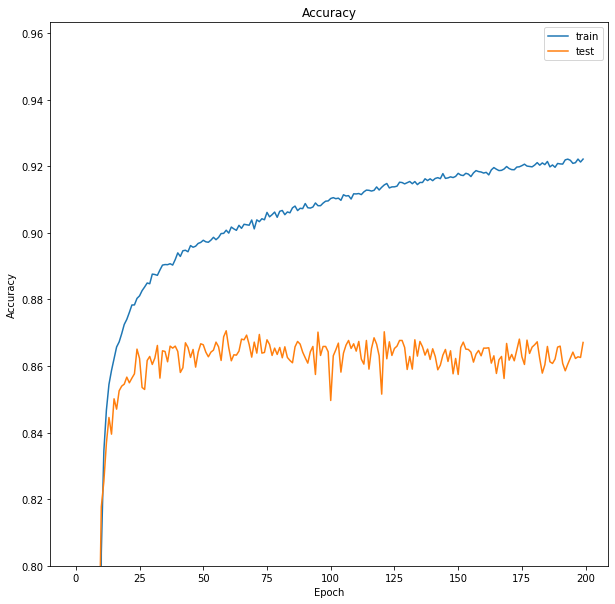

In [68]:
plt.figure(figsize=(10, 10))
plt.plot(log['train_accuracy'], label='train')
plt.plot(log['test_accuracy'], label='test')
plt.ylim(0.8)
plt.title('Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

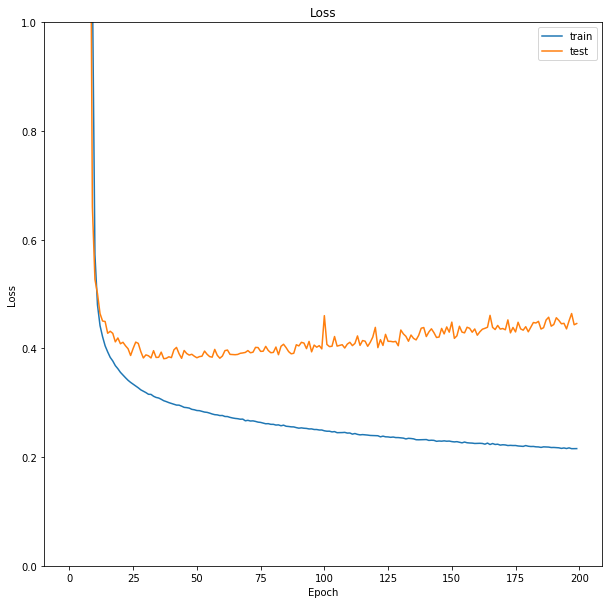

In [70]:
plt.figure(figsize=(10, 10))
plt.plot(log['train_loss'], label='train')
plt.plot(log['test_loss'], label='test')
plt.ylim(0, 1)
plt.title('Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

## Visualization
Here we use a 2 neuron so we can plot it and see how each layer before this layer specifies a feature

In [74]:
INPUT_SHAPE = len(ntrain_data[0])
LEARNING_RATE = 1e-2
EPOCHS = 30
TRAINLOADER = Dataloader(ntrain_data, train_labels, 10, 32, True)
TESTLOADER = Dataloader(ntest_data, test_labels, 10, 32, True)

network = FeedForwardNN(INPUT_SHAPE)
network.add_layer(20, input_shape=INPUT_SHAPE, activation=LeakyRelu(), weight_initializer='normal')
# network.add_layer(20, activation=Relu(), weight_initializer='normal')
network.add_layer(2, activation=LeakyRelu(), weight_initializer='normal')
network.add_layer(10, activation=LeakyRelu(), weight_initializer='normal')
network.set_training_param(loss=CrossEntropy(), lr=LEARNING_RATE)

log = network.fit(EPOCHS, TRAINLOADER, TESTLOADER, print_results=True)

Epoch 1:
	Train: Average Accuracy: 0.11963333333333333	Average Loss: 2.2259035806039607
	Test: Average Accuracy: 0.20012019230769232	Average Loss: 1.7538276353313267
Epoch 2:
	Train: Average Accuracy: 0.36943333333333334	Average Loss: 1.482234820602204
	Test: Average Accuracy: 0.5512820512820513	Average Loss: 1.0718933584103623
Epoch 3:
	Train: Average Accuracy: 0.5834333333333334	Average Loss: 1.0218803651547008
	Test: Average Accuracy: 0.5886418269230769	Average Loss: 1.053056394876781
Epoch 4:
	Train: Average Accuracy: 0.6167166666666667	Average Loss: 0.9593157545187724
	Test: Average Accuracy: 0.6552483974358975	Average Loss: 0.905891421433838
Epoch 5:
	Train: Average Accuracy: 0.64535	Average Loss: 0.9325154108583493
	Test: Average Accuracy: 0.6855969551282052	Average Loss: 0.8739469353778839
Epoch 6:
	Train: Average Accuracy: 0.6724	Average Loss: 0.8644021585846466
	Test: Average Accuracy: 0.6524439102564102	Average Loss: 0.8557880101764266
Epoch 7:
	Train: Average Accuracy: 0.68

In [75]:
train_results, test_results = network.get_outputs()

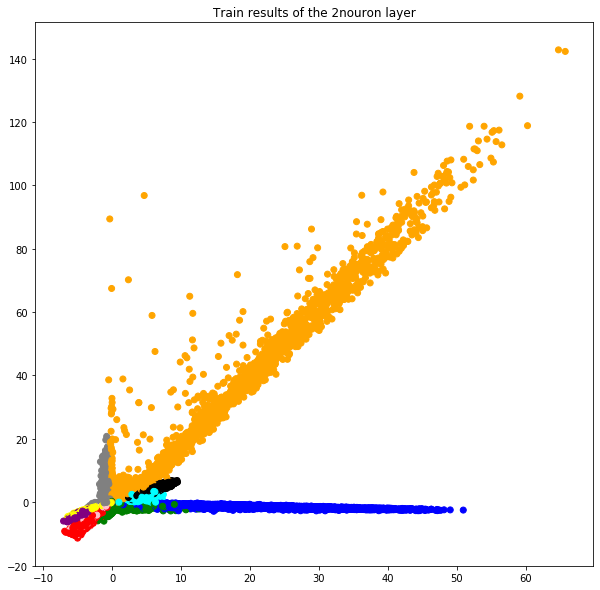

In [101]:
import seaborn as snb

colors = ['red', 'blue', 'purple', 'green', 'yellow', 'orange', 'pink', 'black', 'gray', 'cyan']
plt.figure(figsize=(10, 10))
for batch in train_results:
    x = np.array((batch[0][:, 0]))
    y = np.array((batch[0][:, 1]))
    labels = np.array( batch[1].argmax(1) ).reshape(-1)
    plt.scatter(x, y, color=[colors[labels[i]] for i in range(len(labels))])
plt.title('Train results of the 2nouron layer')
plt.show()

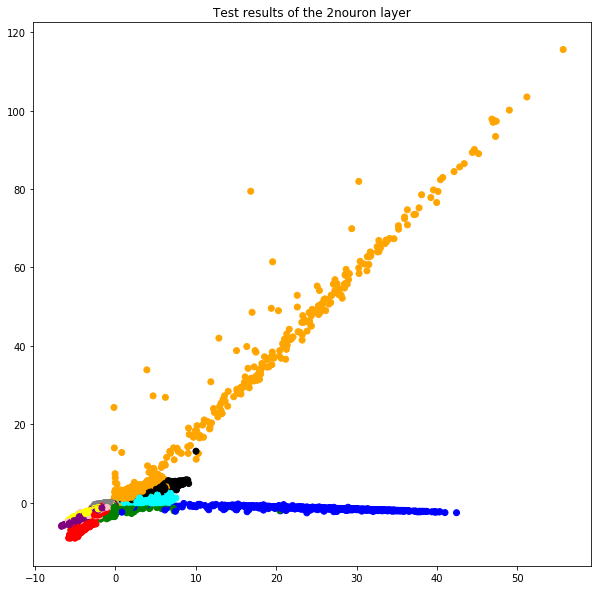

In [102]:
plt.figure(figsize=(10, 10))
for batch in test_results:
    x = np.array((batch[0][:, 0]))
    y = np.array((batch[0][:, 1]))
    labels = np.array( batch[1].argmax(1) ).reshape(-1)
    plt.scatter(x, y, color=[colors[labels[i]] for i in range(len(labels))])
plt.title('Test results of the 2nouron layer')
plt.show()

As we can see data with similar labels have close values their output in the 2noroun layer.